#SIT744
#Deep Learning
#Assignment 1



# 1.1 Problem Definition & Ethical Considerations
Problem Statement

Credit card fraud is a major concern in online banking and e-commerce. Fraudsters exploit vulnerabilities in payment systems to make unauthorized transactions. Detecting fraudulent transactions early can reduce financial losses and protect consumers.

#Objectives

The goal of this project is to develop an fraud detection system using a Neural Network to classify transactions.

Potential Ethical Concerns

*  Dataset Bias: If the dataset is imbalanced, the model might fail to detect real fraud.
*   Fairness Issues: The model might unfairly flag transactions from certain regions, leading to discrimination.
*   False Positives & False Negatives: Incorrect fraud detections can inconvenience customers, while undetected fraud leads to financial losses.


#1.2 Dataset Selection & Preprocessing

Dataset Choice: credit_card_fraud_dataset.csv

The following key features:

TransactionID → Unique identifier

TransactionDate → Timestamp

Amount → Monetary value of the transaction

MerchantID → Encoded merchant identifier

TransactionType → Purchase or refund

Location → Transaction region

IsFraud → Target variable (1 = fraud, 0 = legitimate)




In [25]:
# Import necessary libraries
import pandas as pd
import numpy as np
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader, TensorDataset

#Upload Dataset in Colab
from google.colab import files
files.upload()

Saving credit_card_fraud_dataset.csv to credit_card_fraud_dataset (2).csv


{'credit_card_fraud_dataset (2).csv': b'TransactionID,TransactionDate,Amount,MerchantID,TransactionType,Location,IsFraud\n1,2024-04-03 14:15:35.462794,4189.27,688,refund,San Antonio,0\n2,2024-03-19 13:20:35.462824,2659.71,109,refund,Dallas,0\n3,2024-01-08 10:08:35.462834,784.0,394,purchase,New York,0\n4,2024-04-13 23:50:35.462850,3514.4,944,purchase,Philadelphia,0\n5,2024-07-12 18:51:35.462858,369.07,475,purchase,Phoenix,0\n6,2024-08-30 01:52:35.462867,3086.22,302,purchase,New York,0\n7,2024-01-02 11:31:35.462875,1466.9,902,refund,Philadelphia,0\n8,2024-05-12 12:25:35.462885,917.21,266,purchase,New York,0\n9,2023-11-16 02:20:35.462894,1625.73,32,refund,Chicago,0\n10,2023-10-24 06:51:35.462901,662.07,193,purchase,Dallas,0\n11,2024-08-10 17:08:35.462908,3895.94,349,refund,San Antonio,0\n12,2024-08-27 16:03:35.462915,944.94,359,purchase,San Jose,0\n13,2024-08-31 02:38:35.462922,2855.69,219,refund,New York,0\n14,2023-11-12 13:30:35.462928,4313.82,617,refund,San Jose,0\n15,2024-07-13 09:02:

In [26]:
# Load dataset
df = pd.read_csv("credit_card_fraud_dataset.csv")
# Display first few rows
print(df.head())

# Check the number of fraud and non-fraud transactions
print(df["IsFraud"].value_counts())

   TransactionID             TransactionDate   Amount  MerchantID  \
0              1  2024-04-03 14:15:35.462794  4189.27         688   
1              2  2024-03-19 13:20:35.462824  2659.71         109   
2              3  2024-01-08 10:08:35.462834   784.00         394   
3              4  2024-04-13 23:50:35.462850  3514.40         944   
4              5  2024-07-12 18:51:35.462858   369.07         475   

  TransactionType      Location  IsFraud  
0          refund   San Antonio        0  
1          refund        Dallas        0  
2        purchase      New York        0  
3        purchase  Philadelphia        0  
4        purchase       Phoenix        0  
IsFraud
0    99000
1     1000
Name: count, dtype: int64


Data Preprocessing

Convert timestamps into useful features (hour, day, month).

Normalize numerical values (Amount).

Encode categorical variables (TransactionType, Location).

Handle class imbalance using SMOTE (Synthetic Minority Oversampling Technique).





In [27]:
# Convert TransactionDate
df["TransactionDate"] = pd.to_datetime(df["TransactionDate"])
df["Hour"] = df["TransactionDate"].dt.hour
df["Day"] = df["TransactionDate"].dt.day
df["Month"] = df["TransactionDate"].dt.month
df.drop(columns=["TransactionDate"], inplace=True)

# Encode categorical features
label_encoders = {}
for col in ["TransactionType", "Location"]:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# Normalize
scaler = StandardScaler()
df[["Amount"]] = scaler.fit_transform(df[["Amount"]])

In [28]:
# Define features and target
X = df.drop(columns=["TransactionID", "IsFraud"])
y = df["IsFraud"]

# Handle class imbalance using SMOTE
smote = SMOTE(sampling_strategy=0.2, random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Split into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Convert data into PyTorch tensors
X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 1)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1)

# Create DataLoader for mini-batch training
batch_size = 64
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

#1.3 Simple Fully Connected Neural Network
A fully connected neural network (FCN) is ideal for this classification task.

#Network Architecture

Input Layer: Accepts numerical and encoded categorical transaction features.

Hidden Layer 1: 64 neurons with ReLU activation.

Hidden Layer 2: 32 neurons with ReLU activation.

Output Layer: 1 neuron with Sigmoid activation.


In [29]:
import torch.nn as nn
import torch.optim as optim

# Define the neural network
class FraudDetector(nn.Module):
    def __init__(self, input_dim):
        super(FraudDetector, self).__init__()
        self.fc1 = nn.Linear(input_dim, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 1)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.fc3(x)
        return self.sigmoid(x)

# Instantiate the model
input_dim = X_train.shape[1]
model = FraudDetector(input_dim)

#1.4 Implementing Training Pipeline and Model Evaluation
Training Strategy

Binary Cross-Entropy Loss (BCELoss) for classification.

Adam Optimizer for efficient learning.

Epochs = 20 - Mini-batch training for stability.

Lightweight & Efficient → Works well for small datasets.


In [30]:
# Define loss function and optimizer
criterion = nn.BCELoss()  # Binary Cross-Entropy Loss
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training function
def train_model(model, train_loader, criterion, optimizer, epochs=20):
    model.train()
    for epoch in range(epochs):
        total_loss = 0
        for X_batch, y_batch in train_loader:
            optimizer.zero_grad()
            predictions = model(X_batch)
            loss = criterion(predictions, y_batch)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        print(f"Epoch {epoch+1}, Loss: {total_loss/len(train_loader):.4f}")

# Train model
train_model(model, train_loader, criterion, optimizer, epochs=20)


Epoch 1, Loss: 0.4814
Epoch 2, Loss: 0.4497
Epoch 3, Loss: 0.4420
Epoch 4, Loss: 0.4318
Epoch 5, Loss: 0.4277
Epoch 6, Loss: 0.4248
Epoch 7, Loss: 0.4210
Epoch 8, Loss: 0.4187
Epoch 9, Loss: 0.4157
Epoch 10, Loss: 0.4145
Epoch 11, Loss: 0.4116
Epoch 12, Loss: 0.4095
Epoch 13, Loss: 0.4070
Epoch 14, Loss: 0.4058
Epoch 15, Loss: 0.4043
Epoch 16, Loss: 0.4024
Epoch 17, Loss: 0.4006
Epoch 18, Loss: 0.4004
Epoch 19, Loss: 0.3982
Epoch 20, Loss: 0.3971


In [31]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, average_precision_score

# Evaluation function
def evaluate_model(model, test_loader):
    model.eval()
    y_pred, y_true = [], []

    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            predictions = model(X_batch)
            y_pred.extend(predictions.numpy().flatten())
            y_true.extend(y_batch.numpy().flatten())

    # Convert probabilities
    y_pred = [1 if x >= 0.5 else 0 for x in y_pred]

    # Calculate metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auprc = average_precision_score(y_true, y_pred)

    print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}, AUPRC: {auprc:.4f}")

# Evaluate the model
evaluate_model(model, test_loader)


Accuracy: 0.8399, Precision: 0.5831, Recall: 0.0518, F1 Score: 0.0951, AUPRC: 0.1843


#2.1 Use TensorBoard to Log Loss and Accuracy
Objective

Track model performance visually.

Monitor loss and accuracy across epochs.

In [32]:
# Install TensorBoard
!pip install tensorboard

# Import TensorBoard
from torch.utils.tensorboard import SummaryWriter
import os

log_dir = "runs/fraud_detection"
os.makedirs(log_dir, exist_ok=True)

# Initialize TensorBoard writer
writer = SummaryWriter(log_dir=log_dir)


#2.2 Network Architecture for Better Performance

Batch Normalization for stable training.

LeakyReLU for better gradient flow.

Dropout (0.4) to prevent overfitting.



In [33]:
import torch.nn as nn

class ImprovedFraudDetector(nn.Module):
    def __init__(self, input_dim):
        super(ImprovedFraudDetector, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.bn1 = nn.BatchNorm1d(128)
        self.fc2 = nn.Linear(128, 64)
        self.bn2 = nn.BatchNorm1d(64)
        self.fc3 = nn.Linear(64, 32)
        self.fc4 = nn.Linear(32, 1)
        self.dropout = nn.Dropout(0.4)
        self.leaky_relu = nn.LeakyReLU(0.01)

    def forward(self, x):
        x = self.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.leaky_relu(self.bn2(self.fc2(x)))
        x = self.leaky_relu(self.fc3(x))
        x = self.fc4(x)
        return torch.sigmoid(x)

# Instantiate the improved model
input_dim = X_train.shape[1]
model = ImprovedFraudDetector(input_dim)


#2.3: Adjust Training Configurations for Better Performance

Switch to AdamW Optimizer (better weight decay handling).

Use Cyclical Learning Rate Scheduler (CLR).

Reduce Batch Size (32) for better generalization.

In [34]:
import torch.optim as optim

# Define loss function and optimizer
criterion = nn.BCELoss()  # Binary Cross-Entropy Loss
optimizer = optim.AdamW(model.parameters(), lr=0.0005, weight_decay=1e-4)

# Cyclical Learning Rate (CLR) Scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)


#2.4: Log Training Process Properly with TensorBoard

Loss and learning rate are logged correctly.

The writer is flushed and closed at the end of training.

In [35]:
def train_model_with_logging(model, train_loader, criterion, optimizer, scheduler, epochs=20, writer=None):
    model.train()
    for epoch in range(epochs):
        total_loss = 0
        for X_batch, y_batch in train_loader:
            optimizer.zero_grad()
            predictions = model(X_batch)
            loss = criterion(predictions, y_batch)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        # Log loss and learning rate
        avg_loss = total_loss / len(train_loader)
        writer.add_scalar("Loss/train", avg_loss, epoch)
        writer.add_scalar("Learning Rate", optimizer.param_groups[0]['lr'], epoch)

        scheduler.step()

        print(f"Epoch {epoch+1}, Loss: {avg_loss:.4f}")

# Train the model and log
train_model_with_logging(model, train_loader, criterion, optimizer, scheduler, epochs=20, writer=writer)

writer.flush()
writer.close()


Epoch 1, Loss: 0.4509
Epoch 2, Loss: 0.4378
Epoch 3, Loss: 0.4325
Epoch 4, Loss: 0.4279
Epoch 5, Loss: 0.4249
Epoch 6, Loss: 0.4208
Epoch 7, Loss: 0.4198
Epoch 8, Loss: 0.4181
Epoch 9, Loss: 0.4167
Epoch 10, Loss: 0.4153
Epoch 11, Loss: 0.4134
Epoch 12, Loss: 0.4124
Epoch 13, Loss: 0.4119
Epoch 14, Loss: 0.4112
Epoch 15, Loss: 0.4104
Epoch 16, Loss: 0.4099
Epoch 17, Loss: 0.4094
Epoch 18, Loss: 0.4088
Epoch 19, Loss: 0.4089
Epoch 20, Loss: 0.4083


#2.5: Analyze Model Training Using TensorBoard

In [36]:
# Run TensorBoard
%load_ext tensorboard
%tensorboard --logdir=runs/fraud_detection


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1644), started 0:45:18 ago. (Use '!kill 1644' to kill it.)

<IPython.core.display.Javascript object>

#3.1 Analyze Dataset Biases (Class Distributions & Imbalances)


Legitimate Transactions: 99000
Fraudulent Transactions: 1000
Fraud Ratio: 1.0000%


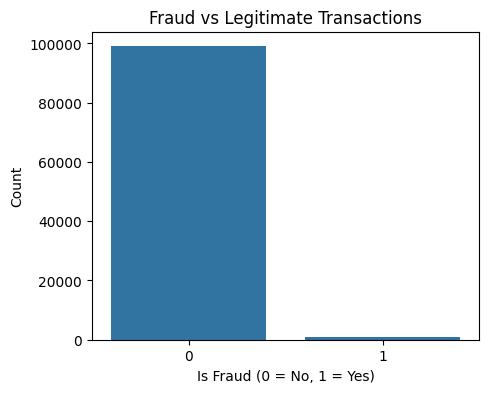

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

# Check the number of fraud vs. non-fraud transactions
fraud_count = df["IsFraud"].value_counts()
print(f"Legitimate Transactions: {fraud_count[0]}")
print(f"Fraudulent Transactions: {fraud_count[1]}")
print(f"Fraud Ratio: {fraud_count[1] / fraud_count.sum() * 100:.4f}%")

# Visualize class distribution
plt.figure(figsize=(5,4))
sns.countplot(x=df["IsFraud"])
plt.title("Fraud vs Legitimate Transactions")
plt.xlabel("Is Fraud (0 = No, 1 = Yes)")
plt.ylabel("Count")
plt.show()


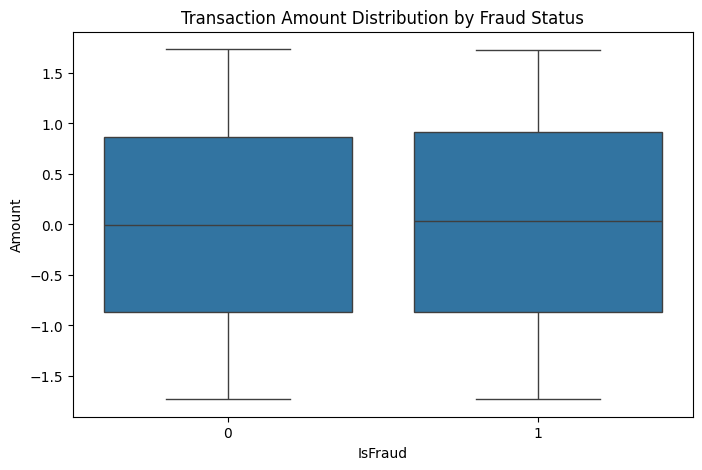

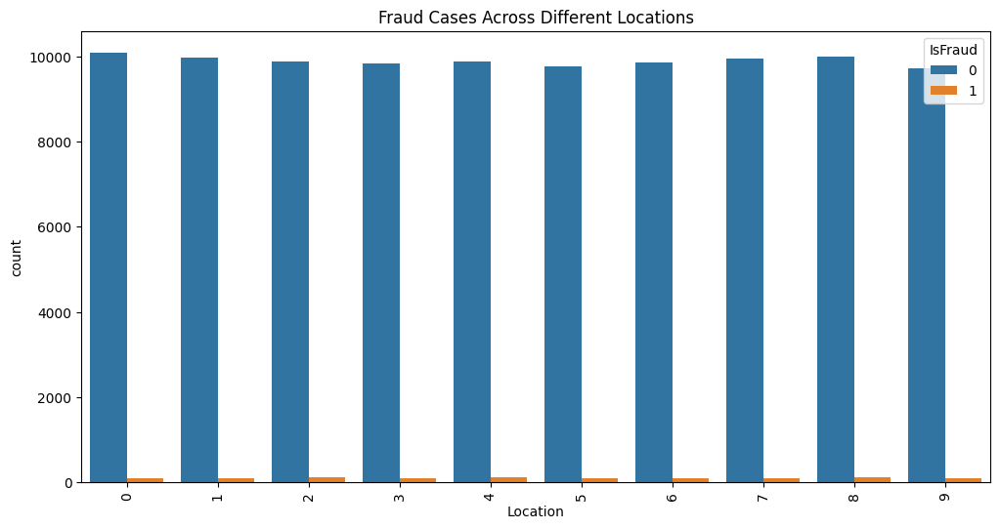

In [38]:
# Visualize fraud distribution by Transaction Amount
plt.figure(figsize=(8, 5))
sns.boxplot(x=df["IsFraud"], y=df["Amount"])
plt.title("Transaction Amount Distribution by Fraud Status")
plt.show()

# Visualize fraud distribution by Location
plt.figure(figsize=(12, 6))
sns.countplot(x=df["Location"], hue=df["IsFraud"])
plt.xticks(rotation=90)
plt.title("Fraud Cases Across Different Locations")
plt.show()


#Bias Insights
Class Imbalance: Fraud cases are significantly fewer.

Transaction Amount Bias: Fraud transactions may have higher transaction values.

Geographical Bias: Some locations may have disproportionately high fraud cases.

Model Implication: The model may learn incorrect patterns and fail to generalize.


#3.2 Experiment with Bias Mitigation Techniques
Objective

Oversampling with SMOTE

Class-Weighted Loss Function

Threshold Adjustment for Predictions

#3.2.1 SMOTE (Synthetic Minority Oversampling Technique)


In [39]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE to rebalance dataset
smote = SMOTE(sampling_strategy=0.3, random_state=42)
X_smote, y_smote = smote.fit_resample(X, y)

# Check new class distribution
new_fraud_count = y_smote.value_counts()
print(f"New Fraud Ratio: {new_fraud_count[1] / sum(new_fraud_count) * 100:.2f}%")


New Fraud Ratio: 23.08%


#3.2.2 Class-Weighted Loss Function

In [41]:
from sklearn.utils.class_weight import compute_class_weight
import torch.nn.functional as F

# Compute class weights
class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y), y=y)
weights = torch.tensor(class_weights, dtype=torch.float32)

# Define weighted loss
class WeightedBCELoss(nn.Module):
    def __init__(self, weight):
        super(WeightedBCELoss, self).__init__()
        self.weight = weight

    def forward(self, predictions, targets):
        loss = -self.weight[1] * (targets * torch.log(predictions)) - \
               self.weight[0] * ((1 - targets) * torch.log(1 - predictions))
        return loss.mean()

# Apply weighted loss
criterion_weighted = WeightedBCELoss(weights)


#3.2.3 Adjusting Classification Threshold
Instead of using a 0.5 threshold, we lower it to increase fraud detection.

In [42]:
# Function to adjust classification threshold
def evaluate_model_with_threshold(model, test_loader, threshold=0.3):
    model.eval()
    y_pred, y_true = [], []

    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            predictions = model(X_batch)
            y_pred.extend(predictions.numpy().flatten())
            y_true.extend(y_batch.numpy().flatten())

    # Adjust classification threshold
    y_pred = [1 if x >= threshold else 0 for x in y_pred]

    # Compute precision, recall, F1-score
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)

    print(f"Threshold: {threshold}")
    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")

# Evaluate at different thresholds
evaluate_model_with_threshold(model, test_loader, threshold=0.3)
evaluate_model_with_threshold(model, test_loader, threshold=0.5)
evaluate_model_with_threshold(model, test_loader, threshold=0.7)


Threshold: 0.3
Precision: 0.3573, Recall: 0.3811, F1 Score: 0.3688
Threshold: 0.5
Precision: 0.5701, Recall: 0.0158, F1 Score: 0.0307
Threshold: 0.7
Precision: 0.0000, Recall: 0.0000, F1 Score: 0.0000


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


#3.3 Evaluate Model Performance on Diverse Data Subsets
Objective

Testing model on different transaction groups to check fairness & generalization.

#3.3.1 Evaluate on High-Value Transactions

In [43]:
# Define high-value transactions
high_value_threshold = np.percentile(df["Amount"], 90)
df_high_value = df[df["Amount"] > high_value_threshold]

# Evaluate model on high-value transactions
X_high_value = df_high_value.drop(columns=["TransactionID", "IsFraud"])
y_high_value = df_high_value["IsFraud"]

# Convert to tensors
X_high_value_tensor = torch.tensor(X_high_value.values, dtype=torch.float32)
y_high_value_tensor = torch.tensor(y_high_value.values, dtype=torch.float32).view(-1, 1)

# Run predictions
with torch.no_grad():
    predictions = model(X_high_value_tensor)
y_pred_high_value = [1 if x >= 0.5 else 0 for x in predictions.numpy().flatten()]

# Compute evaluation metrics
precision = precision_score(y_high_value, y_pred_high_value)
recall = recall_score(y_high_value, y_pred_high_value)
f1 = f1_score(y_high_value, y_pred_high_value)

print(f"High-Value Transactions:")
print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")


High-Value Transactions:
Precision: 0.0000, Recall: 0.0000, F1 Score: 0.0000


#3.3.2 Evaluate Model Across Locations

In [44]:
# Get predictions
with torch.no_grad():
    predictions = model(torch.tensor(df.drop(columns=["TransactionID", "IsFraud"]).values, dtype=torch.float32))
y_pred = [1 if x >= 0.5 else 0 for x in predictions.numpy().flatten()]

df["PredictedFraud"] = (df["IsFraud"] == y_pred).astype(int)
location_performance = df.groupby("Location")["PredictedFraud"].mean().sort_values()

# Show worst-performing locations
print("Worst-performing locations (Fraud detection accuracy):")
print(location_performance.head(10))

Worst-performing locations (Fraud detection accuracy):
Location
4    0.981687
3    0.983293
5    0.986630
2    0.986688
8    0.988626
6    0.989759
1    0.989976
7    0.990161
0    0.990680
9    0.991127
Name: PredictedFraud, dtype: float64
